# FYP - Investigation of Visual Bias in Generative AI

## Introduction 

The outstanding results of Generative AI in creating new visual content, primarily images, have attracted the attention of various individuals.  Platforms such as Mid-Journey, DALL-E2 and Stable Diffusion have empowered many individuals to create custom content based on text prompts and use the output in various contexts. This ranges from entertainment and arts to the generation of images for articles. The output could be biased, depending on the data in the training set and/or in the latent space that the diffusion model uses in the generation phase.  

This project aims to investigate the bias of Generative AI by focusing on the open source and queryable dataset LAION-5B that is used to train the StableDiffusion model. Given a prompt and the stochastic nature of the model, different output results can be investigated for bias. The main elements of the prompt will also be used to investigate the images in the dataset. This will provide insight into whether there is any bias in the output and, if so, from where it originated.  

For example, the prompt “A doctor having a conversation with a nurse” can be used.  The project will use existing and evaluated computer vision techniques to classify the gender of the doctor and nurse at the output.  The same can be done on the images in the dataset for the key entities, in this case, “doctor” and “nurse”.  Since the prompt did not specify the gender of either entity, the output should be fairly balanced in the choice of gender.    

## Notebook outline

1. ### [Libraries Used](#Libraries-Used)
2. ### [Loading Dataset](#Loading-Dataset)
3. ### [Facial Detector Implementation](#Facial-Detector-Implementation)
    - ### [DeepFace](#DeepFace)
    - ### [Inferdo](#Inferdo)
    - ### [BetaFace](#BetaFace)
4. ### [Facial Detector Comparison](#Facial-Detector-Comparison)
5. ### [LAION-5B Image Retrieval](#LAION-5B-Image-Retrieval)
6. ### [Paramater Testing](#Paramater-Testing)

## Libraries Used

This section of the notebook lists the entire set of libraries used to facilitate the project. 

**Note:** The libraries specific to each individual cell will also be present in said cell as comments

In [1]:
import numpy as np
import cv2
import requests
import pandas as pd
import glob
import requests
import urllib.request

from io import BytesIO
from IPython.display import Image, display
from clip_retrieval.clip_client import ClipClient, Modality
from matplotlib import pyplot as plt
from deepface import DeepFace
from PIL import Image as PImg

## Loading Dataset
This section of the notebook involves loading the FairFace dataset. This is required to facilitate comparison between the three candidate API's, these being DeepFace, Inferdo & BetaFace.

The aformentioned dataset can either be loaded/stored locally utilising the code below however it was decided to load only the first 100 images via links so as to allow the notebook to be used without requiring the dataset. 


**Note:** The dataset can be found from the following [link](https://www.kaggle.com/datasets/lantian773030/fairface?resource=download)

In [2]:
# # Specifying the image folder path
# folder_path = 'FairFace/train/'  

# # Retrieving a list of all image file paths in the folder
# image_paths = glob.glob(folder_path)

# # Iterating over each image path and loading the images
# images = []

# no_of_images = 100

# for index in range(1, no_of_images):
#     image = cv2.imread(folder_path+str(index)+".jpg")
#     if image is not None:
#         images.append(image[:,:,::-1])
#     else:
#         print(f"Failed to load image: {image_paths[image_path]}")

In [3]:
# Required import
# import urllib.request

# Unorderd list of first 100 images in the dataset in url form, this was facilitated through the following link: 
# https://postimg.cc/gallery/nxY6KQ7/dda9d683

imgUrl = [
"https://i.postimg.cc/N0f1ZmZp/1.jpg",
"https://i.postimg.cc/KYzM0FgW/10.jpg",
"https://i.postimg.cc/dQTSWc2D/100.jpg",
"https://i.postimg.cc/bvB2MMxw/11.jpg",
"https://i.postimg.cc/Hx87C2z4/12.jpg",
"https://i.postimg.cc/nrvjXh6X/13.jpg",   
"https://i.postimg.cc/j2Vnq7kV/14.jpg",
"https://i.postimg.cc/2jvBc0VC/15.jpg",
"https://i.postimg.cc/ZKSv16dp/16.jpg",
"https://i.postimg.cc/WbwqjtGK/17.jpg",
"https://i.postimg.cc/tgYsh5KQ/18.jpg",
"https://i.postimg.cc/CKXzJ80Z/19.jpg",
"https://i.postimg.cc/2yvvnwB8/2.jpg",
"https://i.postimg.cc/63ZTPQ6M/20.jpg",
"https://i.postimg.cc/T1XhvXpf/21.jpg",
"https://i.postimg.cc/4ybyJF9t/22.jpg",
"https://i.postimg.cc/tRhYt7MT/23.jpg",
"https://i.postimg.cc/fTCyppZQ/24.jpg",
"https://i.postimg.cc/kg5GmsX6/25.jpg",
"https://i.postimg.cc/7ZQ6YzfB/26.jpg",
"https://i.postimg.cc/BvLv8vFJ/27.jpg",
"https://i.postimg.cc/GpWmv1PG/28.jpg",
"https://i.postimg.cc/0Q72fHZ3/29.jpg",
"https://i.postimg.cc/C19kZt5Q/3.jpg",
"https://i.postimg.cc/hvg43b5G/30.jpg",
"https://i.postimg.cc/zvjDmbsF/31.jpg",
"https://i.postimg.cc/J7czHvsH/32.jpg",
"https://i.postimg.cc/Dyvyr6Gj/33.jpg",
"https://i.postimg.cc/gkgcNhqY/34.jpg",
"https://i.postimg.cc/mghLqr87/35.jpg",
"https://i.postimg.cc/6Qv9Wms3/36.jpg",
"https://i.postimg.cc/Z5gbhhM2/37.jpg",
"https://i.postimg.cc/Qtgh5KdZ/38.jpg",
"https://i.postimg.cc/5yx1m9XY/39.jpg",
"https://i.postimg.cc/JnsjzmrX/4.jpg",
"https://i.postimg.cc/D0BhpVGC/40.jpg",
"https://i.postimg.cc/kMc7gSHx/41.jpg",
"https://i.postimg.cc/7YZwG6vj/42.jpg",
"https://i.postimg.cc/J4YmbLM0/43.jpg",
"https://i.postimg.cc/T3yx0439/44.jpg",
"https://i.postimg.cc/9QvhnY4j/45.jpg",
"https://i.postimg.cc/fbmNnSXS/46.jpg",
"https://i.postimg.cc/xCQS0jyx/47.jpg",
"https://i.postimg.cc/63hxTsM9/48.jpg",
"https://i.postimg.cc/Pf2kjjLy/49.jpg",
"https://i.postimg.cc/c18Qqs5y/5.jpg",
"https://i.postimg.cc/0jWgdYgF/50.jpg",
"https://i.postimg.cc/QML2bNP8/51.jpg",
"https://i.postimg.cc/FHJt3kTC/52.jpg",
"https://i.postimg.cc/jd10D44J/53.jpg",
"https://i.postimg.cc/m2kWZ5Cs/54.jpg",
"https://i.postimg.cc/q789ZVV8/55.jpg",
"https://i.postimg.cc/85Nx2KNx/56.jpg",
"https://i.postimg.cc/nz2Np4Lr/57.jpg",
"https://i.postimg.cc/qq7SRNtL/58.jpg",
"https://i.postimg.cc/hv3w7KTq/59.jpg",
"https://i.postimg.cc/MK21qhhc/6.jpg",
"https://i.postimg.cc/SNJHbzbQ/60.jpg",
"https://i.postimg.cc/jq8B149k/61.jpg",
"https://i.postimg.cc/RVyySVv7/62.jpg",
"https://i.postimg.cc/2SWJVR5P/63.jpg",
"https://i.postimg.cc/vmdKnqgD/64.jpg",
"https://i.postimg.cc/nLYPG4B2/65.jpg",
"https://i.postimg.cc/zBzPtykr/66.jpg",
"https://i.postimg.cc/TwtNZTkW/67.jpg",
"https://i.postimg.cc/x8qpQB7p/68.jpg",
"https://i.postimg.cc/KjVq8JhG/69.jpg",
"https://i.postimg.cc/RZGt1qqf/7.jpg",
"https://i.postimg.cc/v8SShHgJ/70.jpg",
"https://i.postimg.cc/yYgpb40k/71.jpg",
"https://i.postimg.cc/bN7VXCRL/72.jpg",
"https://i.postimg.cc/bw1CqxCP/73.jpg",
"https://i.postimg.cc/0NxtjzFw/74.jpg",
"https://i.postimg.cc/Tw3CjZR2/75.jpg",
"https://i.postimg.cc/q7L13kHZ/76.jpg",
"https://i.postimg.cc/j2WcmPwG/77.jpg",
"https://i.postimg.cc/mDpVm8DY/78.jpg",
"https://i.postimg.cc/kGksmGWD/79.jpg",
"https://i.postimg.cc/bwqb21Yp/8.jpg",
"https://i.postimg.cc/jq9ZNgBK/80.jpg",
"https://i.postimg.cc/XY6L1ZVz/81.jpg",
"https://i.postimg.cc/KvMQ57yT/82.jpg",
"https://i.postimg.cc/y8hPMVxY/83.jpg",
"https://i.postimg.cc/Dz2gFt4Q/84.jpg",
"https://i.postimg.cc/mr8Sr87v/85.jpg",
"https://i.postimg.cc/Y90zLY3h/86.jpg",
"https://i.postimg.cc/HxN4wnZ3/87.jpg",
"https://i.postimg.cc/XqyKQWtW/88.jpg",
"https://i.postimg.cc/MpYLy0yD/89.jpg",
"https://i.postimg.cc/RV7KFgBg/9.jpg",
"https://i.postimg.cc/nMb4W5tD/90.jpg",
"https://i.postimg.cc/MZcghQS6/91.jpg",
"https://i.postimg.cc/44rjZxfz/92.jpg",
"https://i.postimg.cc/52JGYKFy/93.jpg",
"https://i.postimg.cc/pdX6k9Ct/94.jpg",
"https://i.postimg.cc/fTmpbQy1/95.jpg",
"https://i.postimg.cc/XvHDPV1B/96.jpg",
"https://i.postimg.cc/W3dfLQxW/97.jpg",
"https://i.postimg.cc/XJt1VsbV/98.jpg",
"https://i.postimg.cc/fyX2kYzY/99.jpg"]

# Function used to extract the JPG names from the URLs
def extract_jpg_name(url):
    return int(url.split('/')[-1].split('.')[0])

# Sorting the images based on the name
imgUrl = sorted(imgUrl, key=extract_jpg_name)

## Facial Detector Implementation

This section of the notebook includes the implementation of the API's utilising their default paramaters. 

In [7]:
# Function used to display the images alongside their relevant data
def ImageInfoDisplay(imageDict):
    for itemIndex in range(len(imageDict.items())):
        plt.imshow(imageDict[itemIndex][0], interpolation='nearest', cmap="gray")
        plt.axis("Off")
        text = ""
        
        # Determining the data to display based on the API used
        if 'age' in imageDict[itemIndex][1]:
            text += "Age: " + str(imageDict[itemIndex][1]['age'])
        
        if 'gender' in imageDict[itemIndex][1]:
            text += "\nGender: " + str(imageDict[itemIndex][1]['gender'])
            
        if 'race' in imageDict[itemIndex][1]:
            text += "\nRace: " + str(imageDict[itemIndex][1]['race'])
            
        if 'emotion' in imageDict[itemIndex][1]:
            text += "\nEmotion:" + str(imageDict[itemIndex][1]['emotion'])
        
        plt.text(0, imageDict[itemIndex][0].shape[0]-10, text, color='red')
        plt.show()

### DeepFace

The DeepFace API can be found from the following [link](https://github.com/serengil/deepface). 

The implementation itself follows the guide present on the APIs github page found through the same link.

In [4]:
# Required libraries

# from deepface import DeepFace

In [5]:
# Function which carries out the DeepFace API on the provided list of images
def DeepFaceProcess(listOfImages):
    # Dict used to store the images alongside their data
    DeepFaceDict = {}
    # Counter used to keep track of the dictionary position 
    counter = 0
    
    # Looping through the list of images
    for imgIndex in range(len(listOfImages)):
        try:
            # Retrieving the age/gender/race/emotion of the image
            # Note: enforce_detection=False used so that images where the face isn't fully visible are still considered
            objs = DeepFace.analyze(listOfImages[imgIndex], actions = ['age', 'gender', 'race', 'emotion'], enforce_detection=False)

            if objs[0]['dominant_gender'] == "Man":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Male", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}
            elif objs[0]['dominant_gender'] == "Woman":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Female", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}

            # Send a GET request to the URL and retrieving the image data
            response = requests.get(listOfImages[imgIndex])
            image_data = response.content

            # Converting the image to matrix form
            img = np.array(PImg.open(BytesIO(image_data)))

            # Storing the images in a dictionary 
            DeepFaceDict[counter] = [img,ImageInfo]
            counter+=1
        except:
            counter-=1
            print("Error: Image failed to be processed")
        
    return DeepFaceDict

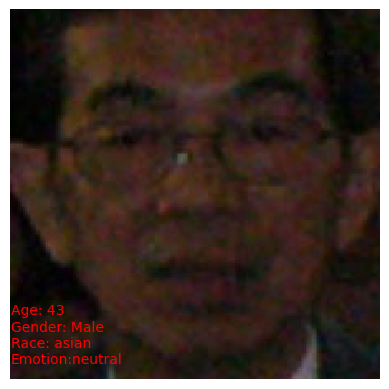

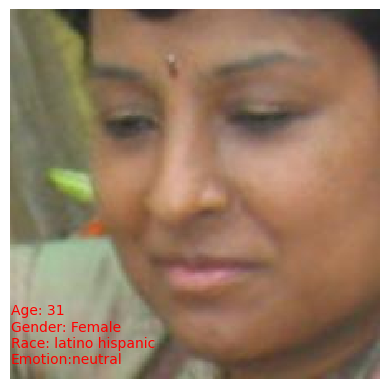

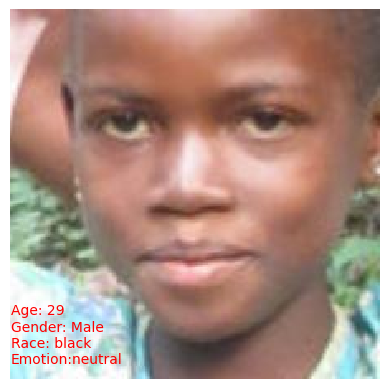

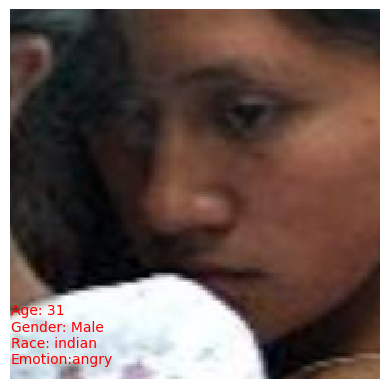

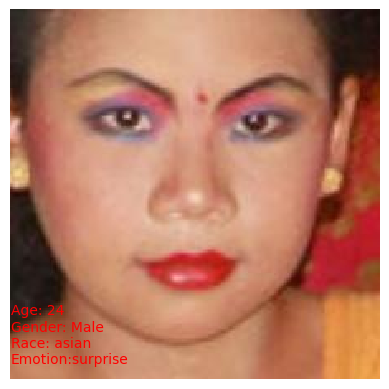

...

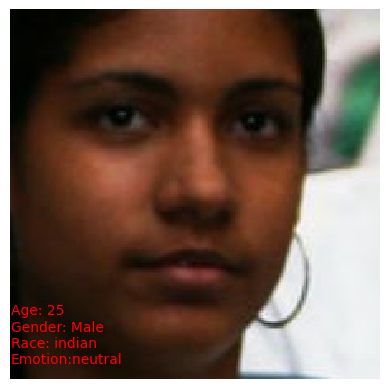

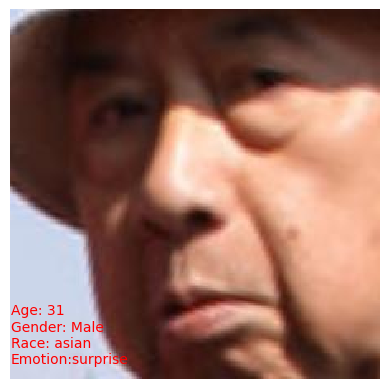

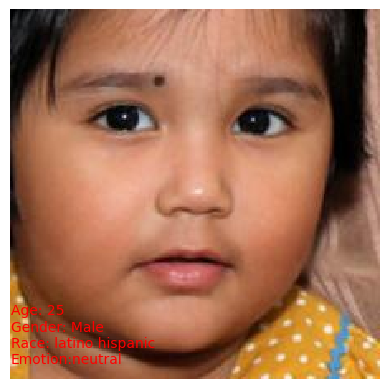

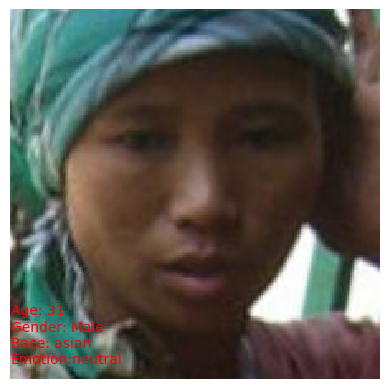

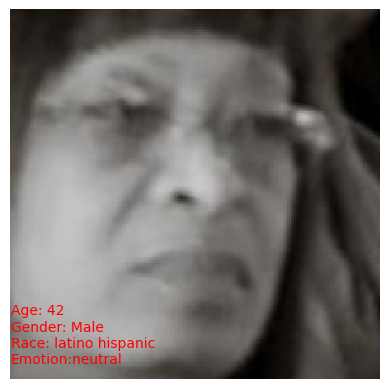

In [8]:
DeepFaceDict = DeepFaceProcess(imgUrl[0:50])

# Displaying the DeepFace processed images
ImageInfoDisplay(DeepFaceDict)

### Inferdo

The DeepFace API can be found from the following [link](https://inferdo.com/).

The implementation itself follows the guide present in the following [link](https://rapidapi.com/inferdo/api/face-detection6).

In [9]:
# Required libraries

# import requests
# from PIL import Image
# from io import BytesIO

In [10]:
# Function which carries out the Inferdo API on the provided list of images
def InferdoAPIProcess(imgUrls, accuracyLvl):
    # Dict used to store the images alongside their data
    InferdoAPIDict = {}
    
    # Specifying the required input data for the API
    url = "https://face-detection6.p.rapidapi.com/img/face-age-gender"
    
    headers = {
        "content-type": "application/json",
        "X-RapidAPI-Key": "2e915f0481msh738a16bbbadc6a5p1e4925jsn86a91ba9e1fd",
        "X-RapidAPI-Host": "face-detection6.p.rapidapi.com"
    }
    
    # Looping through all the image urls
    for imgIndex in range(len(imgUrls)):
        
        # Url denotes the image url to be processed & accuracy_boost denotes the accuracy that the API will utilise varies from 1 to 4
        payload = {
            "url": imgUrls[imgIndex],
            "accuracy_boost": accuracyLvl
        }

        # Sending a request to the API
        response = requests.post(url, json=payload, headers=headers)
        
        ImageInfo = ""
        
        # Retrieving the resultant data, 0 is used in case multiple faces are deteceted in a single image only the first one is considered
        if response.json()['detected_faces'] != []:
            gender = response.json()['detected_faces'][0]['Gender']['Gender']
            ageLow = response.json()['detected_faces'][0]['Age']['Age-Range']['Low']
            ageHigh = response.json()['detected_faces'][0]['Age']['Age-Range']['High']
            ImageInfo = {'age':str(ageLow)+" - "+str(ageHigh), 'gender':gender}
        
        # Send a GET request to the URL and retrieving the image data
        response = requests.get(imgUrls[imgIndex])
        image_data = response.content
        # Converting the image to matrix form
        img = np.array(PImg.open(BytesIO(image_data)))
      
        # Storing the images in a dictionary 
        InferdoAPIDict[imgIndex] = [img, ImageInfo]
        
    return InferdoAPIDict  

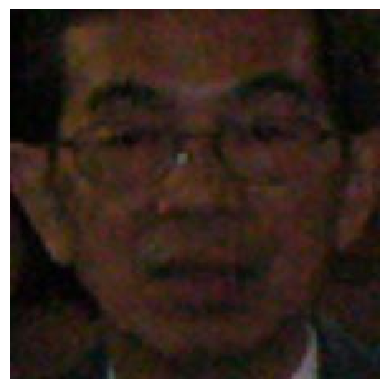

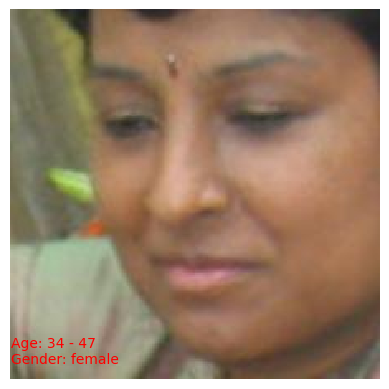

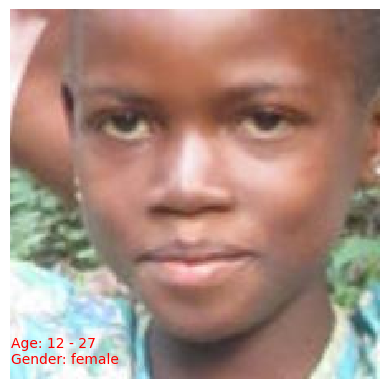

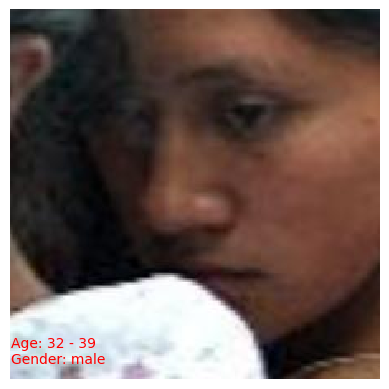

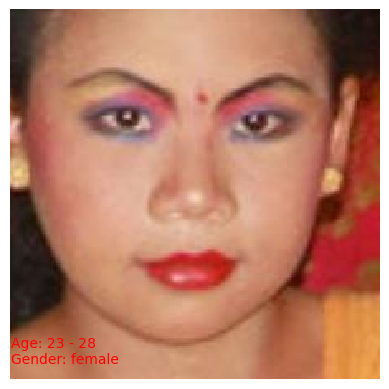

...

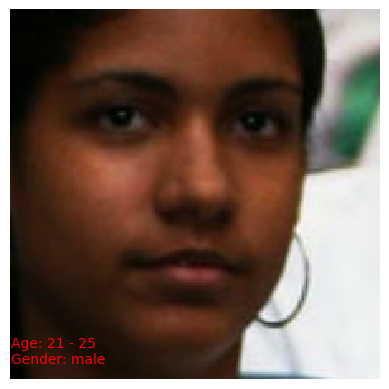

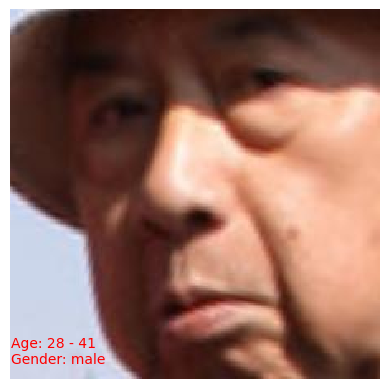

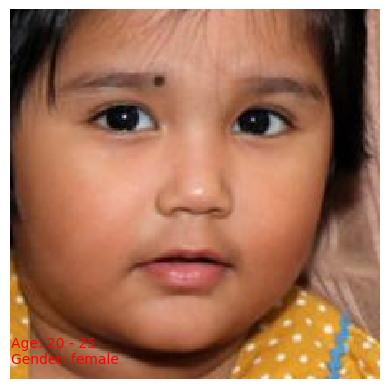

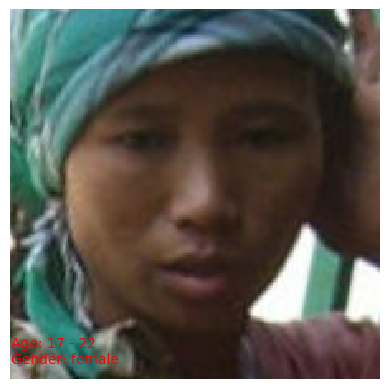

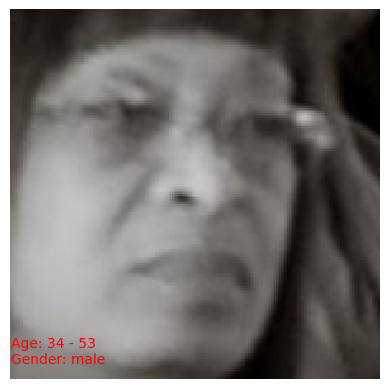

In [11]:
accuracyLvl = 3
InferdoAPIDict = InferdoAPIProcess(imgUrl[0:50], accuracyLvl)

# Displaying the Inferdo processed images
ImageInfoDisplay(InferdoAPIDict)

### BetaFace

The BetaFace API can be found from the following [link](https://www.betafaceapi.com/wpa/). 

The implementation itself follows the guide present in the following [video](https://www.youtube.com/watch?v=TIGV4sozmd0).

**Note:** In light of the fact that the BetaFace API had no clear way to acquire the non-free version in their website the free version is being utilised, which comes with a **50 image daily limit**.

In [12]:
# Required libraries

# import requests
# from PIL import Image
# from io import BytesIO

In [13]:
def BetaFaceAPIProcess(imgUrls):
    BetaFaceAPIDict = {}
    
    url = 'https://www.betafaceapi.com/api/v2/media'
    
    headers = {
        'accept': 'application/json',
        'Content-Type': 'application/json',
    }
    
    # Arbitrary name required by the API (can be cahnged to anything)
    filename = "tmp.jpg"
    
    # Looping through all the image urls
    for imgIndex in range(len(imgUrls)):
        
        # Url denotes the image url to be processed & accuracy_boost denotes the accuracy that the API will utilise varies from 1 to 4
        data = '{"api_key": "d45fd466-51e2-4701-8da8-04351c872236", "file_uri": "' + imgUrls[imgIndex] + '", "detection_flags": "basicpoints,propoints,classifiers,content", "recognize_targets": [ "all@mynamespace" ], "original_filename": "' + filename + '"}'
        
        # Sending a request to the API
        response = requests.post(url, headers=headers, data=data).json()
        
        ImageInfo = ""
        
        # Retrieving the resultant data, 0 is used in case multiple faces are deteceted in a sinhle image only the first one is considered
        if 'error_code' not in response and 'media' in response:
            if response['media']['faces'] != None:
                gender = response['media']['faces'][0]['tags'][18]['value']
                age = response['media']['faces'][0]['tags'][1]['value']
                emotion = response['media']['faces'][0]['tags'][17]['value']
                race = response['media']['faces'][0]['tags'][31]['value']

                ImageInfo = {'age':age, 'gender':gender, 'race':race, 'emotion':emotion}
            else:
                ImageInfo = {'age':0, 'gender':"n/a", 'race':"n/a", 'emotion':"n/a"}
        else:
            if response['error_code'] == -57:
                print("Maximum Daily Image Reached")
                break
                
        # Send a GET request to the URL and retrieving the image data
        response = requests.get(imgUrls[imgIndex])
        image_data = response.content
        # Converting the image to matrix form
        img = np.array(PImg.open(BytesIO(image_data)))
      
        BetaFaceAPIDict[imgIndex] = [img, ImageInfo]
        
    return BetaFaceAPIDict

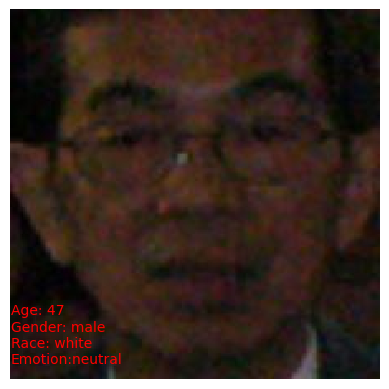

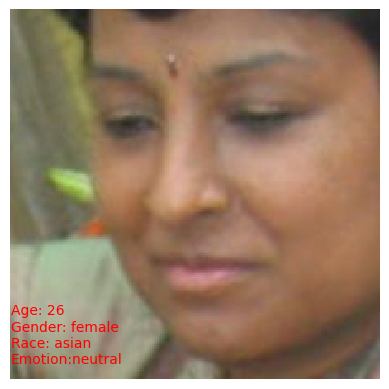

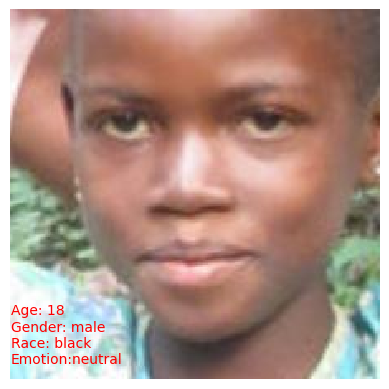

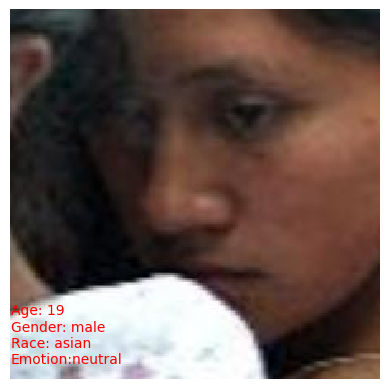

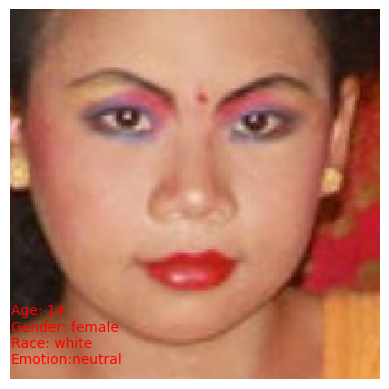

...

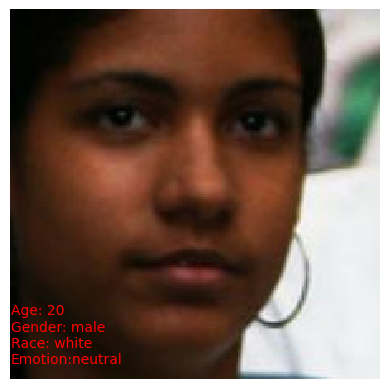

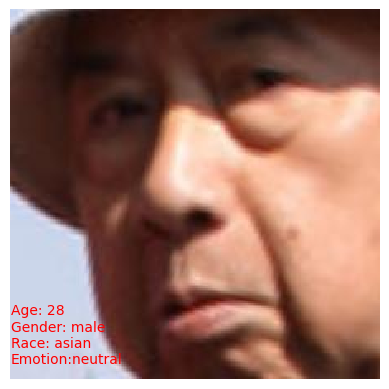

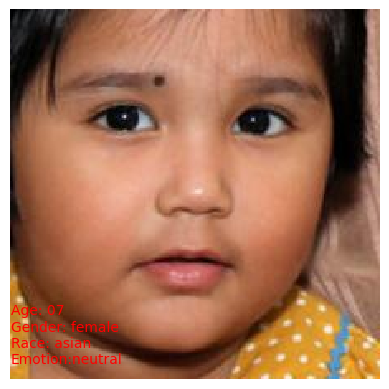

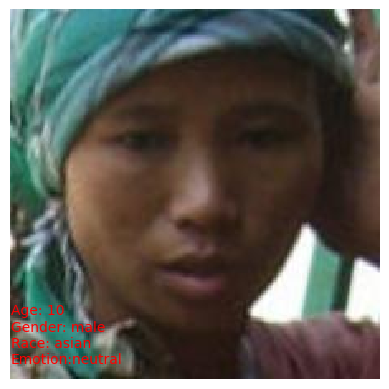

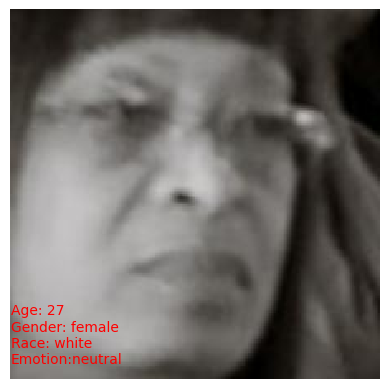

In [14]:
BetaFaceAPIDict = BetaFaceAPIProcess(imgUrl[0:50])
# Displaying the Inferdo processed images
ImageInfoDisplay(BetaFaceAPIDict)

## Facial Detector Comparison

This section of the notebook compares the outputs produced in the previous section with the ground truth of the FairFace dataset. This then leads to a conclusion as to which API is best out of the three.

In [15]:
# Retrieving the ground truth data link:https://github.com/dchen236/FairFace

# Specify the ground truth file path
csv_file = 'FairFace/groundTruth/fairface_label_train.csv'

df = pd.read_csv(csv_file)

In [16]:
# Retrivieng all unique races in the dataset, this is done to replace them with a label common to all three API's
uniqueRaces = df['race'].unique()
print(uniqueRaces)

['East Asian' 'Indian' 'Black' 'White' 'Middle Eastern' 'Latino_Hispanic'
 'Southeast Asian']


In [17]:
# Function used to replace data with its equivalent thus facilitating easier processing
def CleanFairFaceGroundTruth(df):
    df['race'].replace('East Asian', 'Asian', inplace=True)
    df['race'].replace('Latino_Hispanic', 'Latino', inplace=True)
    df['race'].replace('Southeast Asian', 'Asian', inplace=True)
    
CleanFairFaceGroundTruth(df)

In [18]:
# Function used to keep track of which results match with the groundturth 
def CompareResultsToGroundTruth(imageDict, groundTruth):
    #Counters used keep track of mis/matches
    ageMatchCounter = 0
    genderMatchCounter = 0
    raceMatchCounter = 0
    emotionMatchCounter = 0
    detection = 0
    
    ageMisMatchCounter = 0
    genderMisMatchCounter = 0
    raceMisMatchCounter = 0
    emotionMisMatchCounter = 0
    noDetection = 0
    
    for itemIndex in range(len(imageDict.items())):
        
        if imageDict[itemIndex][1] != '':
            detection +=1 
            
            # Checking for correct age assignment 
            if 'age' in imageDict[itemIndex][1] and 'age' in groundTruth:
                # Extract the lower and upper limits
                lower_limit, upper_limit = map(int, groundTruth['age'][itemIndex].split("-"))
                age = imageDict[itemIndex][1]['age']
                if lower_limit <= int(age) <= upper_limit:
                    ageMatchCounter+=1
                else:
                    ageMisMatchCounter+=1

            # Checking for correct gender assignment 
            if 'gender' in imageDict[itemIndex][1] and 'gender' in groundTruth:
                if imageDict[itemIndex][1]['gender'].lower() == groundTruth['gender'][itemIndex].lower():
                    genderMatchCounter+=1
                else:
                    genderMisMatchCounter+=1

            # Checking for correct race assignment 
            if 'race' in imageDict[itemIndex][1] and 'race' in groundTruth:
                if imageDict[itemIndex][1]['race'].lower() == groundTruth['race'][itemIndex].lower():
                    raceMatchCounter+=1
                else:
                    raceMisMatchCounter+=1

            # Checking for correct emotion assignment 
            if 'emotion' in imageDict[itemIndex][1] and 'emotion' in groundTruth:
                if imageDict[itemIndex][1]['emotion'].lower() == groundTruth['emotion'][itemIndex].lower():
                    emotionMatchCounter+=1
                else:
                    emotionMisMatchCounter+=1
        else:
            noDetection+=1
    
    return {'age':ageMatchCounter,
    'gender':genderMatchCounter,
    'race':raceMatchCounter,
    'emotion':emotionMatchCounter,
    'ageNot':ageMisMatchCounter,
    'genderNot':genderMisMatchCounter,
    'raceNot':raceMisMatchCounter,
    'emotionNot':emotionMisMatchCounter,
    'detection': detection,
    'detectionNot':noDetection}

In [19]:
# Function which draws a bar chart of the passed data
def DrawBarChart(category, listOfDicts):
    barWidth = 0.25
    fig = plt.subplots(figsize =(12, 8))

    # set height of bar
    Correct = []
    Incorrect = []
    
    for key in listOfDicts.keys():
        Correct.append(listOfDicts[key][category])
        Incorrect.append(listOfDicts[key][category+'Not'])

    # Set position of bar on X axis
    br1 = np.arange(len(Correct))
    br2 = [x + barWidth for x in br1]

    # Make the plot
    plt.bar(br1, Correct, color ='g', width = barWidth,
            edgecolor ='grey', label ='Correct')
    plt.bar(br2, Incorrect, color ='r', width = barWidth,
            edgecolor ='grey', label ='Incorrect')

    # Adding Xticks
    plt.xlabel('API', fontweight ='bold', fontsize = 15)
    plt.ylabel('No. of Images', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(Correct))],listOfDicts.keys())

    plt.legend()
    plt.show()

In [20]:
DeepFaceComparisonResults = CompareResultsToGroundTruth(DeepFaceDict,df)

In [21]:
# Inferdo API data cleanup - since the api returns a range for the age of the detected face the average value of the lower 
# and upper range limit is calculted and used. This is done to simplify processing
for itemIndex in range(len(InferdoAPIDict)):
    if InferdoAPIDict[itemIndex][1]:
        if InferdoAPIDict[itemIndex][1]['age']:
            
            lower_limit, upper_limit = map(int, InferdoAPIDict[itemIndex][1]['age'].split("-"))
            
            # Converting the age range into an average of the lower/upper limits
            InferdoAPIDict[itemIndex][1]['age'] = round((lower_limit + upper_limit)/2)

In [22]:
InferdoAPICompareResults = CompareResultsToGroundTruth(InferdoAPIDict, df)

In [23]:
BetaFaceCompareResults = CompareResultsToGroundTruth(BetaFaceAPIDict, df)

In [ ]:
## Visualisation

In [24]:
listOfDicts = {'Deepface':DeepFaceComparisonResults, 'Inferdo':InferdoAPICompareResults, 'BetaFace':BetaFaceCompareResults}

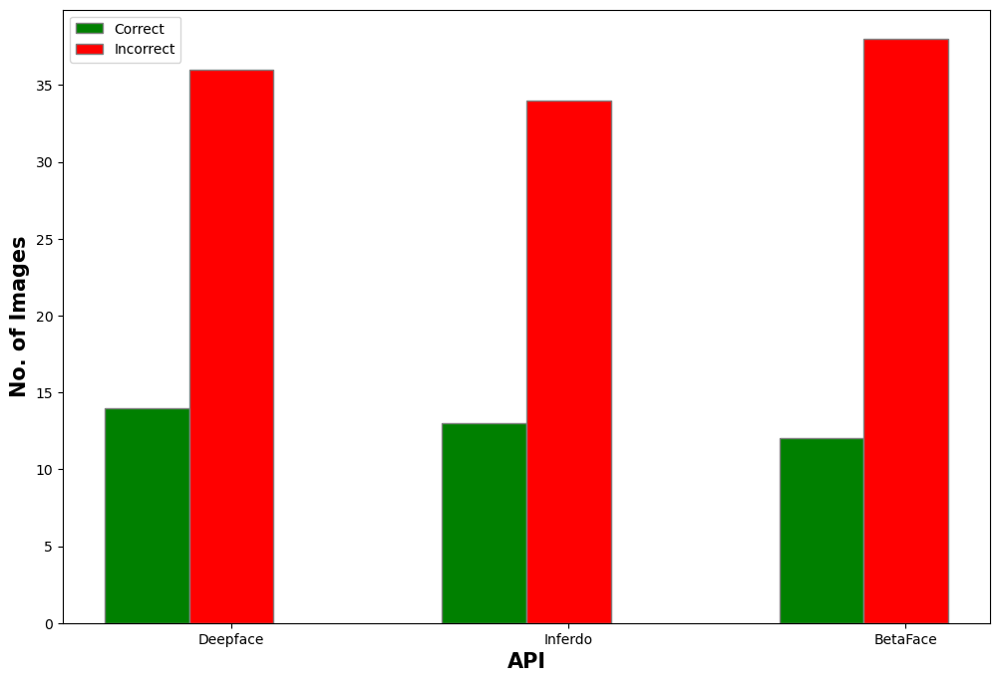

In [25]:
category = 'age'
DrawBarChart(category, listOfDicts)

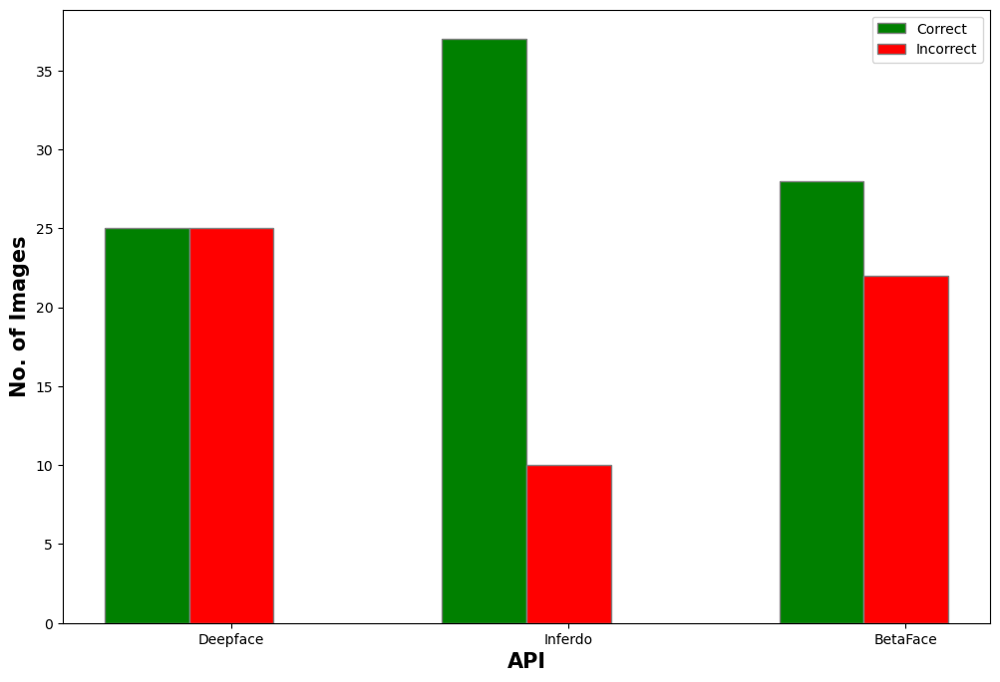

In [26]:
category = 'gender'
DrawBarChart(category, listOfDicts)

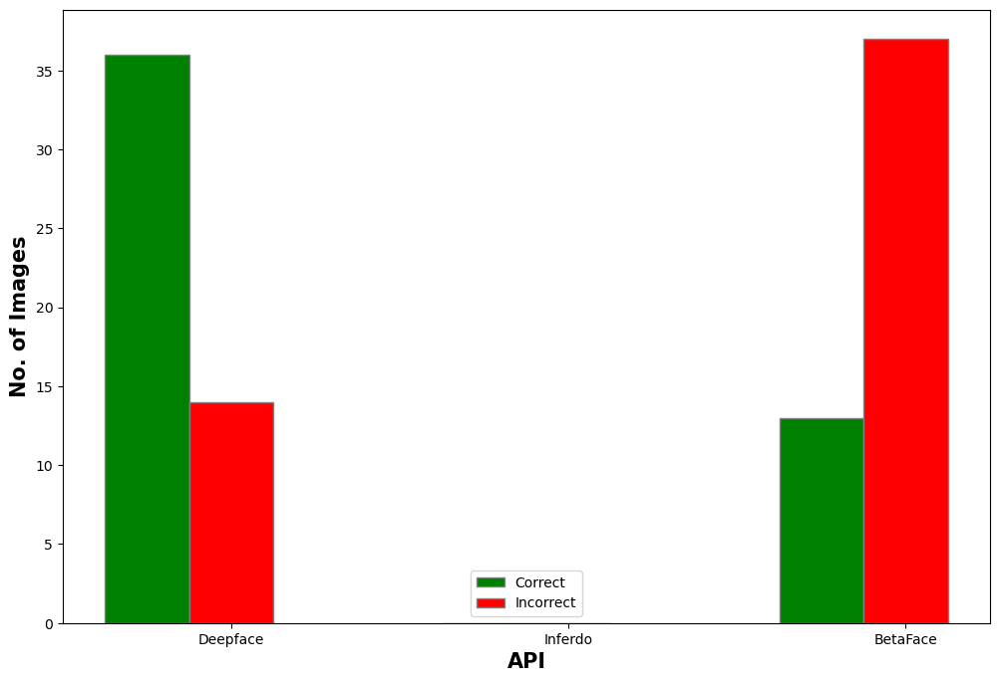

In [27]:
category = 'race'
DrawBarChart(category, listOfDicts)

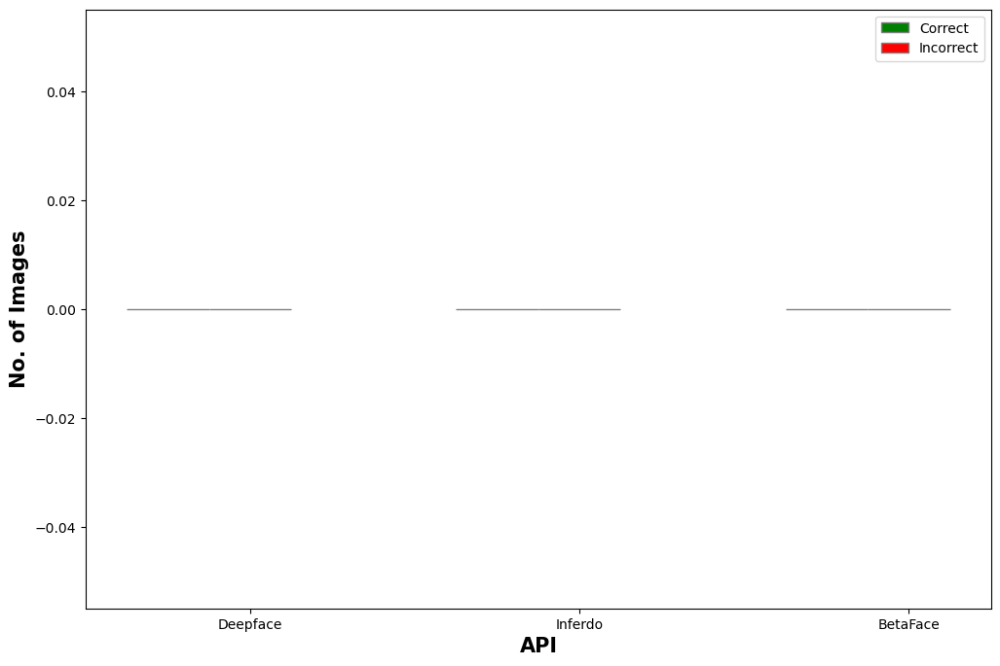

In [28]:
category = 'emotion'
DrawBarChart(category, listOfDicts)

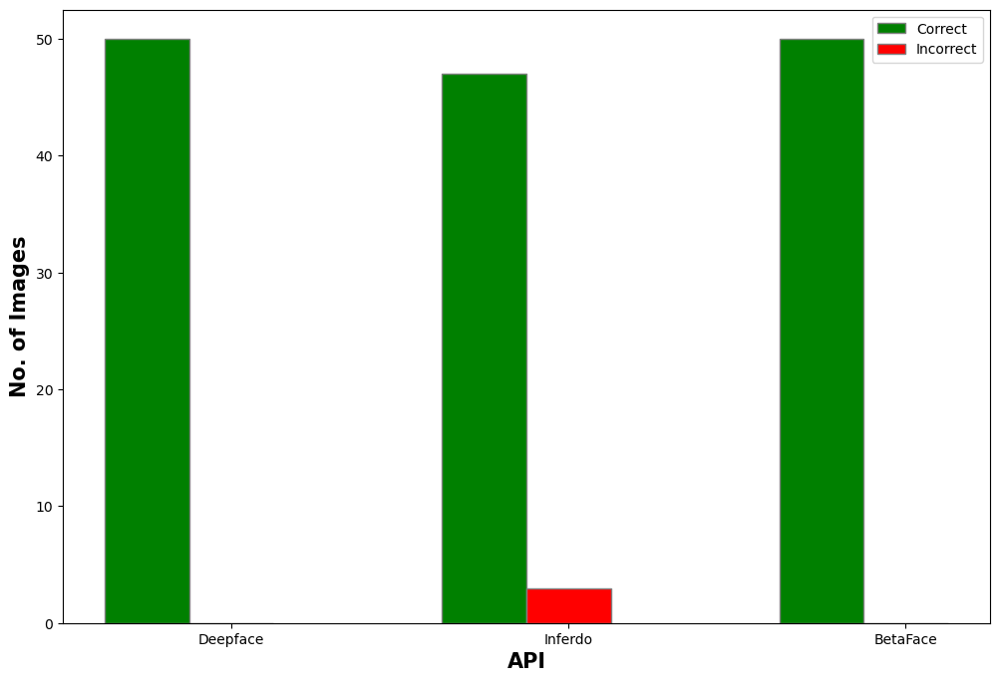

In [29]:
category = 'detection'
DrawBarChart(category, listOfDicts)

## LAION-5B Image Retrieval

## Paramater Testing